In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

In [3]:
df = pd.read_csv('/content/time-series-analysis.csv')

In [4]:
df

,Date,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,...,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur
0,02-01-2019 00:00,119.9,130.3,234.1,85.8,313.9,40.7,30.0,52.5,5.0,...,268.3,6.3,82.3,24.8,70.2,108.2,2.0,2.1,21.7,2.7
1,03-01-2019 00:00,121.9,133.5,240.2,85.5,311.8,39.3,30.1,54.1,4.9,...,285.2,6.5,82.0,25.6,67.9,110.2,1.9,2.2,23.4,2.4
2,04-01-2019 00:00,118.8,128.2,239.8,83.5,320.7,38.1,30.1,53.2,4.8,...,270.3,6.4,82.9,26.3,66.3,106.8,1.7,2.2,21.7,2.4
3,05-01-2019 00:00,121.0,127.5,239.1,79.2,299.0,39.2,30.2,51.5,4.3,...,286.8,6.6,77.0,23.0,65.8,107.0,2.0,2.2,22.5,2.7
4,06-01-2019 00:00,121.4,132.6,240.4,76.6,286.8,39.2,31.0,53.2,4.3,...,298.3,7.2,76.4,22.6,62.9,106.4,2.0,2.2,21.7,2.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
498,01-12-2020 00:00,130.8,126.0,220.4,77.3,322.8,36.5,25.4,45.4,3.6,...,357.3,8.5,82.9,26.3,105.7,172.6,1.4,2.1,20.4,2.1
499,02-12-2020 00:00,129.4,127.3,218.4,81.3,331.4,37.0,25.8,45.2,3.7,...,356.9,8.5,85.0,25.2,112.3,174.4,1.5,2.1,23.3,2.4
500,03-12-2020 00:00,132.1,129.7,205.6,85.6,336.7,37.8,26.2,45.2,4.0,...,355.1,8.7,85.4,24.0,113.0,169.8,1.4,2.1,21.7,2.3
501,04-12-2020 00:00,132.1,128.4,207.0,83.9,334.6,38.2,27.0,43.0,4.0,...,353.5,8.6,70.0,19.3,111.6,145.5,1.2,2.0,24.2,2.5


In [5]:
missing_values = df.isnull().sum()
missing_values

Date                 0
Punjab               0
Haryana              0
Rajasthan            0
Delhi                0
UP                   0
Uttarakhand          0
HP                   0
J&K                  0
Chandigarh           0
Chhattisgarh         0
Gujarat              0
MP                   0
Maharashtra          0
Goa                  0
DNH                  0
Andhra Pradesh       0
Telangana            0
Karnataka            0
Kerala               0
Tamil Nadu           0
Pondy                0
Bihar                0
Jharkhand            0
Odisha               0
West Bengal          0
Sikkim               0
Arunachal Pradesh    0
Assam                0
Manipur              0
dtype: int64

In [6]:
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

In [7]:
# Summary statistics
summary_stats = df.describe()
print("Summary Statistics:")
print(summary_stats)


Summary Statistics:
           Punjab     Haryana   Rajasthan       Delhi          UP  \
count  503.000000  503.000000  503.000000  503.000000  503.000000   
mean   141.145527  138.333598  218.443340   83.380716  314.036382   
std     56.977361   38.106593   27.421615   25.915357   66.516960   
min     56.100000   64.800000  105.800000   41.800000  186.800000   
25%    104.000000  114.800000  205.800000   63.500000  263.650000   
50%    118.300000  126.800000  222.900000   72.700000  290.000000   
75%    162.500000  158.100000  237.600000  105.800000  370.550000   
max    300.000000  237.200000  278.000000  147.100000  471.800000   

       Uttarakhand          HP         J&K  Chandigarh  Chhattisgarh  ...  \
count   503.000000  503.000000  503.000000  503.000000    503.000000  ...   
mean     36.157058   26.568191   44.264016    4.141551     83.877137  ...   
std       6.705108    4.807040    4.769391    1.143422     10.130427  ...   
min      16.800000   11.800000   17.800000    2.20

In [8]:
correlation_matrix = df.corr()
print("\nCorrelation Matrix:")
print(correlation_matrix)


Correlation Matrix:
                     Punjab   Haryana  Rajasthan     Delhi        UP  \
Punjab             1.000000  0.955670   0.376721  0.902512  0.804649   
Haryana            0.955670  1.000000   0.517610  0.942060  0.839751   
Rajasthan          0.376721  0.517610   1.000000  0.442719  0.360466   
Delhi              0.902512  0.942060   0.442719  1.000000  0.906172   
UP                 0.804649  0.839751   0.360466  0.906172  1.000000   
Uttarakhand        0.656262  0.764229   0.749317  0.733879  0.646279   
HP                 0.437242  0.552601   0.738944  0.453851  0.313448   
J&K               -0.178045 -0.140497   0.382112 -0.162798 -0.128536   
Chandigarh         0.895890  0.926031   0.530860  0.935308  0.829112   
Chhattisgarh       0.367010  0.406083   0.225714  0.466436  0.481145   
Gujarat            0.170198  0.289899   0.619435  0.354093  0.330733   
MP                -0.355840 -0.237214   0.569785 -0.272191 -0.231171   
Maharashtra       -0.078480  0.007564   0.4

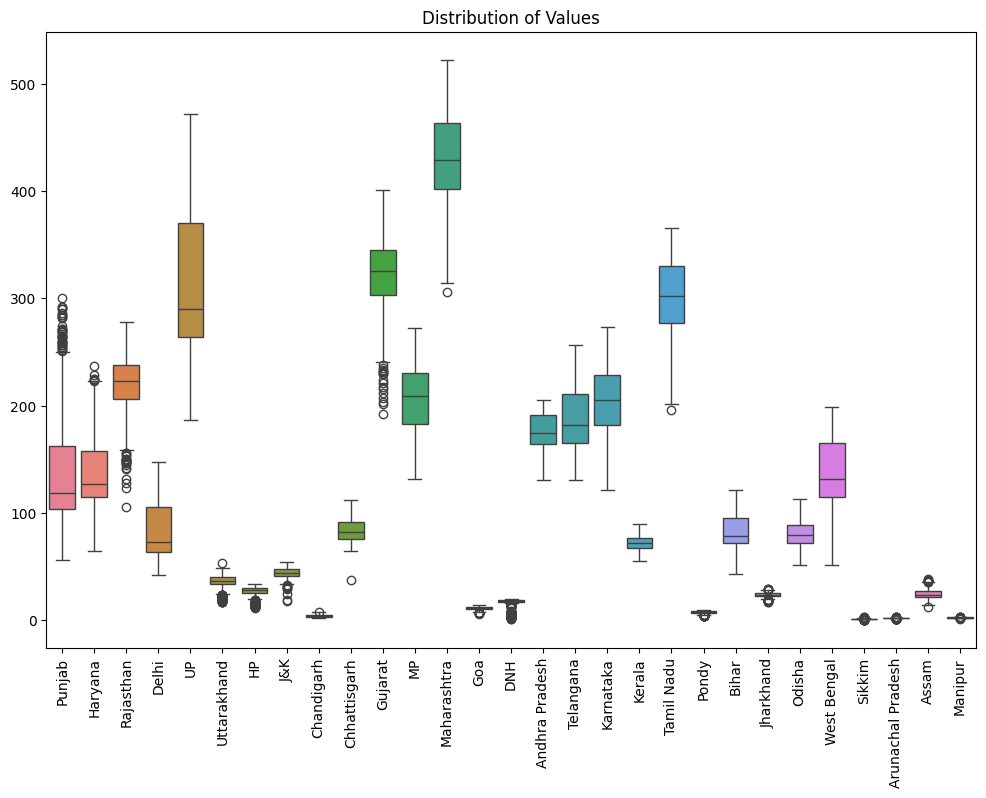

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.title("Distribution of Values")
plt.xticks(rotation=90)
plt.show()

In [10]:
# Pairplot for visualizing relationships
sns.pairplot(df)
plt.title("Pairplot of Regions")
plt.show()

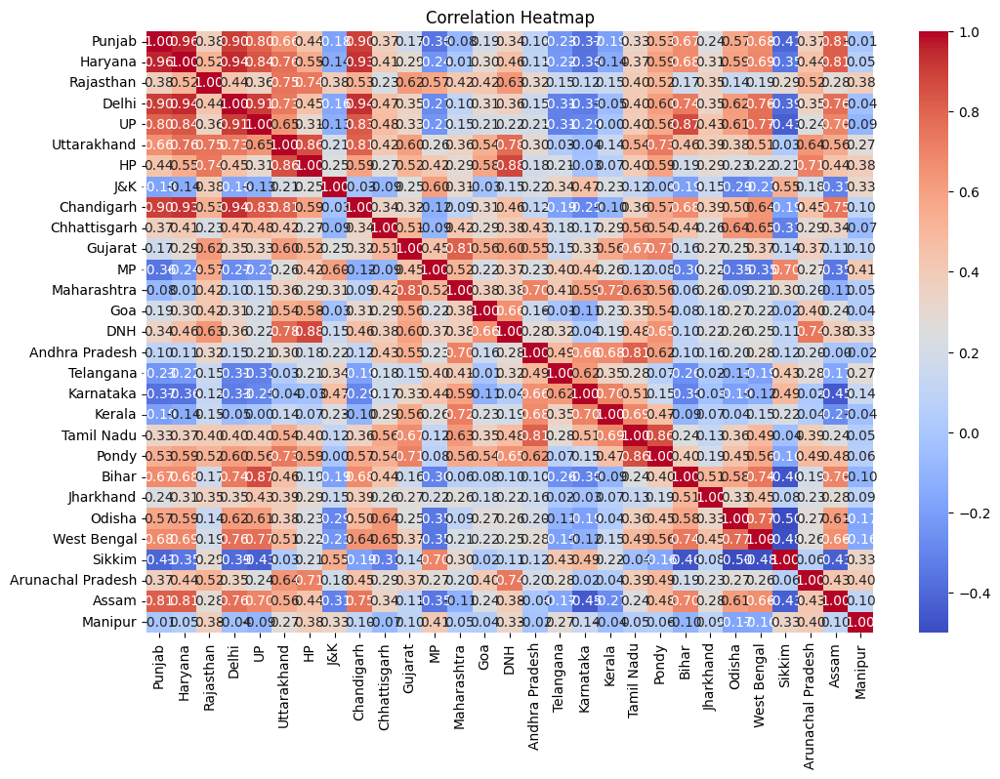

In [11]:
# Heatmap for correlation visualization
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [12]:
from statsmodels.tsa.seasonal import seasonal_decompose

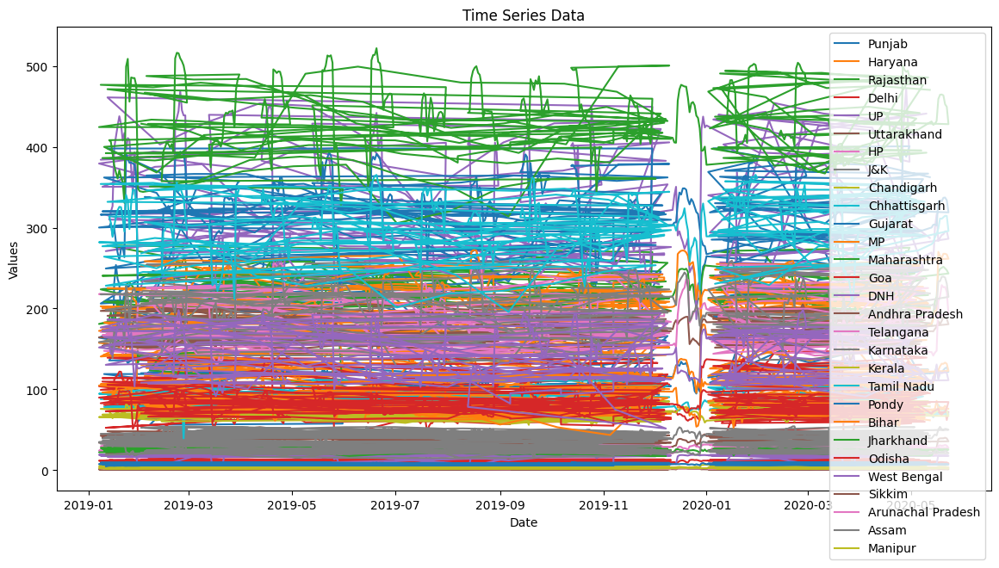

In [13]:
# EDA: Plot time series data
plt.figure(figsize=(14, 7))
for column in df.columns:
    plt.plot(df.index, df[column], label=column)
plt.title('Time Series Data')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

In [14]:
# Time series decomposition
decomposition = seasonal_decompose(df['Punjab'], model='additive', period=1)  # Assuming no seasonality
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

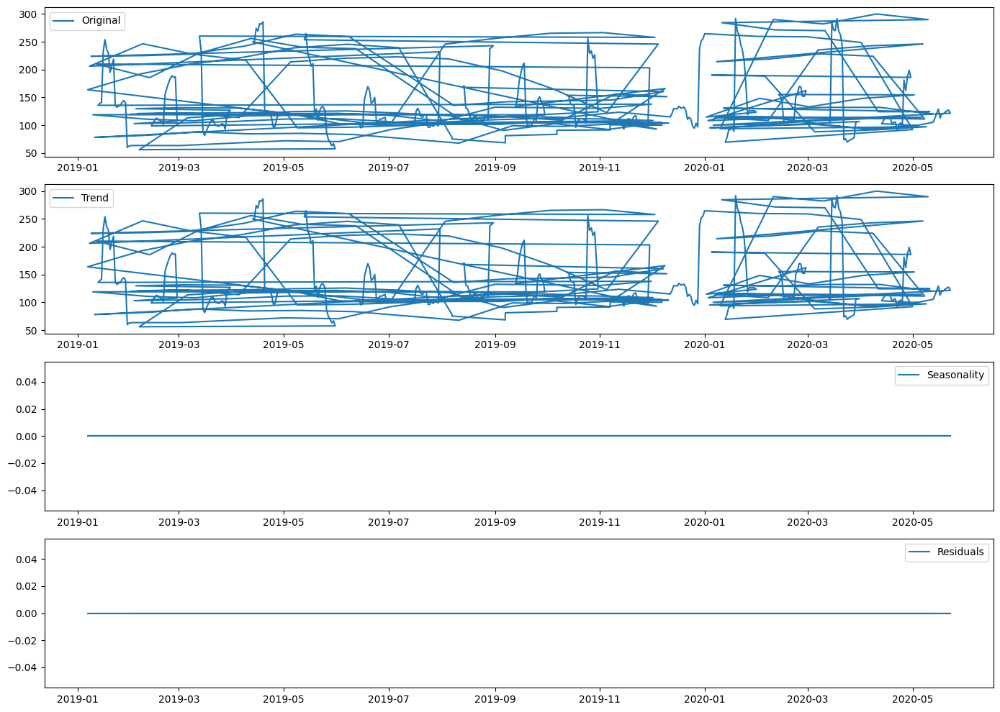

In [15]:
# Plot decomposition components
plt.figure(figsize=(14, 10))

plt.subplot(411)
plt.plot(df.index, df['Punjab'], label='Original')
plt.legend(loc='best')

plt.subplot(412)
plt.plot(df.index, trend, label='Trend')
plt.legend(loc='best')

plt.subplot(413)
plt.plot(df.index, seasonal, label='Seasonality')
plt.legend(loc='best')

plt.subplot(414)
plt.plot(df.index, residual, label='Residuals')
plt.legend(loc='best')

plt.tight_layout()
plt.show()

In [16]:
# Simple Moving Average model
window_size = 3  # Adjust window size as needed
rolling_mean = df['Punjab'].rolling(window=window_size).mean()


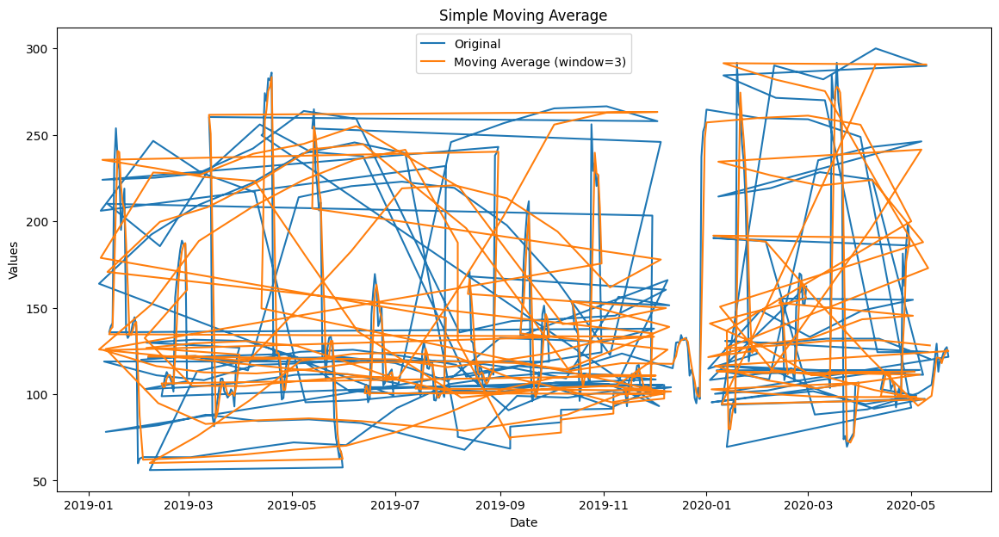

In [17]:
# Plot original data and rolling mean
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['Punjab'], label='Original')
plt.plot(df.index, rolling_mean, label='Moving Average (window=3)')
plt.title('Simple Moving Average')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

In [20]:
# Calculate Mean Absolute Error (MAE)
mae = df['Kerala'] - rolling_mean
mae = mae.abs().mean()
print("Mean Absolute Error (MAE) of the Simple Moving Average model:", mae)

Mean Absolute Error (MAE) of the Simple Moving Average model: 69.20685296074517
